<a href="https://colab.research.google.com/github/daphnedemekas/Age-Prediction-from-Brain-Scans/blob/master/Selecting_Images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Welcome! Before starting please make sure to have the huxley_duran folder shortcutted in your drive. you can do that by just clicking on the huxley_duran folder on the top right and selecting "add shortcut to drive". You will also need to add the timecode document to your Drive as well. 

#Imports

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
!pip install lpips

In [5]:
import os
import torch
import lpips
import regex as re

from tqdm.notebook import tqdm
from torchvision.io.image import read_image, ImageReadMode

#Get Images

### This function will take a while when you run it for the first time,  but once it has been run once, it will be super quick

In [40]:
def run_fast_scandir(dir, ext):    
    #scrape all the images from huxley_duran
    subfolders, files = [], []

    for f in os.scandir(dir):
        if f.is_dir():
            subfolders.append(f.path)
        if f.is_file():
            if os.path.splitext(f.name)[1].lower() in ext:
                files.append(f.path)
    for dir in list(subfolders):
        sf, f = run_fast_scandir(dir, ext)
        subfolders.extend(sf)
        files.extend(f)
    return subfolders, files


top_folder = '/content/drive/MyDrive/huxley_duran'
subfolders, files = run_fast_scandir(top_folder, [".png", ".jpeg", ".jpg"])

### Here you need to put the path to the timecode document. Also please make sure that you are searching the document in the correct place for the images. Right now the images exist between lines 2 and 119, and you can see below that we are searching between those rows. Please adjust if that changes!

In [184]:
import csv

path_to_timecode_document = '/content/drive/MyDrive/Edit w_ timecode - Sheet1 (1).csv'

required_imgs = []
with open(path_to_timecode_document) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    for row in csv_reader:
        if line_count >= 2 and line_count <= 119:
            required_imgs.append(row[5])
        line_count += 1

In [18]:
import numpy as np
from pathlib import Path

##This is the path which determines the images that we are selecting from in the director. Right now its under the path below, but change this if needed.

In [272]:
img_dir = "/content/drive/MyDrive/huxley_duran/Wendy/To select/images/current"

In [273]:
director_folders, director_files = run_fast_scandir(img_dir, [".png", ".jpeg", ".jpg"])

In [287]:
#here we are filtering the files, only taking those which don't have the same name, disregarding the numbers.
# This is to ensure we don't have too many similar photos in our collection
import re
unique_files = []
director_files_unique = []
for f in director_files:
  f_no_numbers = re.sub(r'\d+', '', f)
  if f_no_numbers not in unique_files:
    unique_files.append(f_no_numbers)
    director_files_unique.append(f)


In [213]:
import cv2

##Here we are loading the images. This also takes a little while, but not too long, patience is key!

In [ ]:
images = {}
for i in tqdm(director_files_unique):
  ref = lpips.im2tensor( lpips.load_image(i)).cuda()
  images[i] = ref


In [296]:
#need to make sure that our required images are in the images dict 
for required_img in png_files:
  path = png_files[required_img]
  if path not in images.keys():
    ref = lpips.im2tensor( lpips.load_image(path)).cuda()
    images[path] = ref
    director_files_unique.append(path)


In [320]:
len(director_files_unique)

275

#Director

In [538]:
import numpy as np
import torch.nn.functional as F

def get_A_matrix(files, images, K):
  loss_fn = lpips.LPIPS(net='alex').cuda()
  v = []
  m = [[],[]]
  choice_len = int(K/2)

  for j in tqdm(range(len(files))):
    choices = np.random.choice(range(K), choice_len, replace=False)
    while j in choices:
      choices = np.random.choice(range(K), choice_len, replace=False)
    track_values = []
    for k in choices:
      noise = np.random.normal(0,0.2)
      img1 = images[files[j]]
      img2 = images[files[k]]
      if img1.shape != img2.shape:
        img1 = F.interpolate(img1, size=img2.shape[2])
      value = torch.exp(-loss_fn.forward(img1, img2)).squeeze().detach() + noise
      v.append(value)

      m[0].append(j)
      m[1].append(k)
    #images.pop(files[v.index(minv)])
  A = torch.sparse_coo_tensor(m, v, (K,K))
  return A

##Here we are loading our transition matrix, which creates transitions between all the images. this will also take a bit of time, about 5 to 10 minutes.

In [539]:
K = len(director_files_unique)
A = get_A_matrix(director_files_unique, images, K)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth


In [503]:
def viterbi(T, A, K, Pi, x_T =None):
    """
    Return the MAP estimate of state trajectory of Hidden Markov Model.

    Parameters
    ----------
    y : array (T,)
        Observation state sequence. int dtype.
    A : array (K, K)
        State transition matrix. See HiddenMarkovModel.state_transition  for
        details.
    B : array (K, M)
        Emission matrix. See HiddenMarkovModel.emission for details.
    Pi: optional, (K,)
        Initial state probabilities: Pi[i] is the probability x[0] == i. If
        None, uniform initial distribution is assumed (Pi[:] == 1/K).

    Returns
    -------
    x : array (T,)
        Maximum a posteriori probability estimate of hidden state trajectory,
        conditioned on observation sequence y under the model parameters A, B,
        Pi.
    T1: array (K, T)
        the probability of the most likely path so far
    T2: array (K, T)
        the x_j-1 of the most likely path so far
    """
    # Initilaize the tracking tables from first observation
    T1 = [Pi] # * B[:, y[0]]
    T2 = [0]

    # Iterate throught the observations updating the tracking tables
    for i in range(1, T):

      dense_A = A[i - 1].to_dense()
      norm = dense_A.sum(-1)
      dense_A[norm == 0.] = 1./K
      dense_A /= dense_A.sum(-1, keepdims=True)

      R = T1[i - 1] * dense_A
      tmax = torch.max(R, 0)
      vals = tmax.values
      T1.append((vals/vals.sum()).unsqueeze(-1))
      T2.append(tmax.indices)

    # Build the output, optimal model trajectory
    x = torch.zeros(T, dtype=torch.long)
    if x_T:
      x[-1] = x_T
    else:
      argm = torch.argmax(T1[-1][:,0])
      x[-1] = argm
      
    for i in reversed(range(1, T)):
        x[i - 1] = T2[i][x[i]]

    return x, T1, T2

In [543]:
import random

K = len(director_files_unique)
all_sequences = []
#Here you can decide how many images you want to create on each iteration (the length of the image sequence). 
T = 10
for i, f in enumerate(png_files):
  Pi = torch.zeros(K)
  index = director_files_unique.index(png_files[f])
  Pi[index] = 1

  if i != len(png_files)-1:
    end_file = list(png_files.values())[i+1]
    x_T = director_files_unique.index(end_file)
  else:
    x_T = None
  x, T1, T2 = viterbi(T, [A]*T, K, Pi, x_T) 
  all_sequences.append(x)

##Here you can visualize the selection. If you don't like it at all, try changing the value of T, or just running it again. If you REALLY don't like it at all and think something might be wrong, send me a text, i will have my phone on :-) Some issues I noticed was that there were a load of random green photos and a bit of repetition. If you find a photo keeps coming up that you really don't like, you can just remove it from director_files_unique, but you will have to run everything again if you do so. 

In [ ]:
#If you want to remove a photo and you can check which number that photo is by printing all_sequences and matching it up with the visualization below
#Then just run
#director_files_unique.remove(director_files_unique[number_of_ugly_image])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


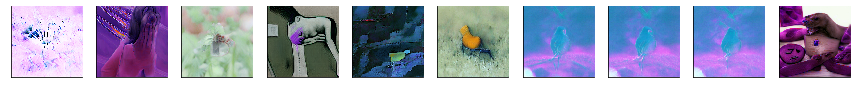

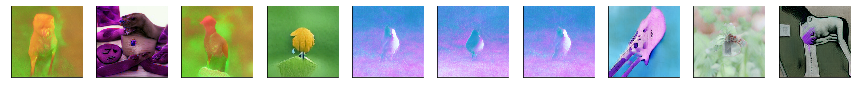

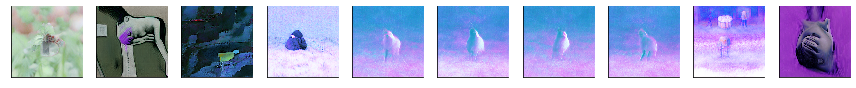

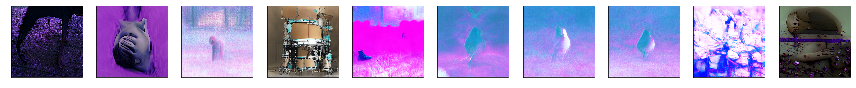

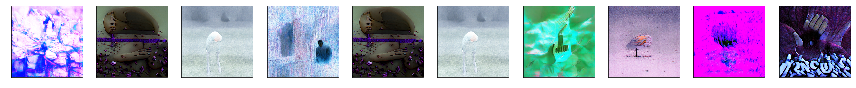

...

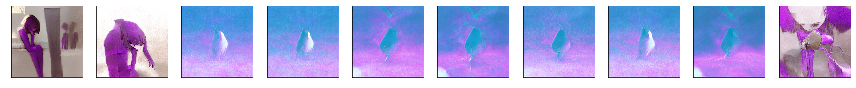

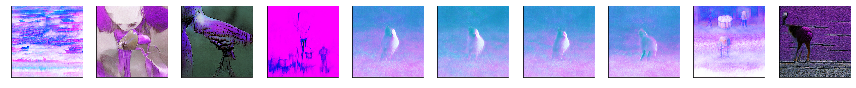

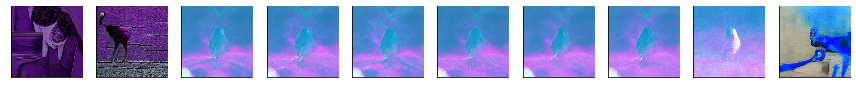

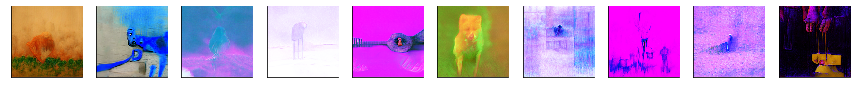

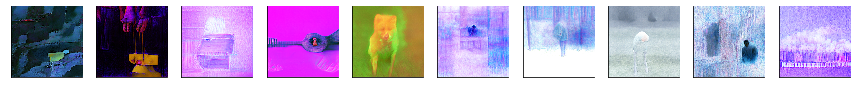

In [545]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

for s, sequence in enumerate(all_sequences):
  fig, axes = plt.subplots(1, len(sequence), figsize=(12, 12), sharex=True, sharey=True)
  for p, i in enumerate(sequence):
    npimg = lpips.tensor2im(images[director_files_unique[i]])

    k, l = np.unravel_index(p, (1,len(sequence)))
    axes[l].imshow(npimg, interpolation='nearest')
    axes[l].set_xticks([])
    axes[l].set_yticks([])

  sns.despine(fig)
  fig.tight_layout()

#Get my dictionaries!

In [608]:
sequence_files = []
for sequence in all_sequences:
  sequence_files.append(list(set([director_files[i] for i in sequence])))

In [551]:
def run_fast_scandir(dir, ext):    # dir: str, ext: list
    subfolders, files = [], []

    for f in os.scandir(dir):
        if f.is_dir():
            subfolders.append(f.path)
        if f.is_file():
            if os.path.splitext(f.name)[1].lower() in ext:
                files.append(f.path)
    for dir in list(subfolders):
        sf, f = run_fast_scandir(dir, ext)
        subfolders.extend(sf)
        files.extend(f)
    return subfolders, files


top_folder = '/content/drive/MyDrive/huxley_duran' #here put the directory that contains all the files that we might need
subfolders, npz_files = run_fast_scandir(top_folder, [".npz"])

In [619]:
npz_filenames = np.array([Path(npz).parts[-1][:-6] for npz in npz_files])

In [663]:
def find_latent_files(npzs, filenames):
  npz_indices = {}
  missing_filenames = []
  found_filenames = []
  edit_npz = np.array([s.translate(str.maketrans('', '', string.punctuation)).lower().replace(" ", "") for s in npzs])
  edit_file = np.array([s.translate(str.maketrans('', '', string.punctuation)).lower().replace(" ", "")[:-3] for s in filenames])
  for i, f in enumerate(edit_file):
    if f in edit_npz:
      npz_index = np.where(edit_npz == f)[0][0]
      npz_indices[filenames[i]] = npz_files[npz_index]
      found_filenames.append(filenames[i])
    elif f[-1] in edit_npz:
      npz_index = np.where(edit_npz == f[-1])[0][0]
      npz_indices[filenames[i]] = npz_files[npz_index]
      found_filenames.append(filenames[i])
    else:
      missing_filenames.append(filenames[i])
  edited_npz2 = np.array([''.join(i for i in s if not i.isdigit()) for s in edit_npz])
  edit_file2 = np.array([''.join(i for i in s if not i.isdigit()) for s in edit_file])

  for i, f in enumerate(edit_file2):
    if f in edited_npz2:
      if filenames[i] in missing_filenames:
        npz_index = np.where(edited_npz2 == f)[0][0]
        npz_indices[filenames[i]] = npz_files[npz_index]
        found_filenames.append(filenames[i])
        missing_filenames.remove(filenames[i])
    elif f[-1] in edited_npz2:
      if filenames[i] in missing_filenames:
        npz_index = np.where(edited_npz2 == f[-1])[0][0]
        npz_indices[filenames[i]] = npz_files[npz_index]
        found_filenames.append(filenames[i])
        missing_filenames.remove(filenames[i])
  return npz_indices, missing_filenames, found_filenames

In [664]:
#first we need the npzs for the original files 
original_files = list(png_files.keys())

original_indices, original_mf, original_found = find_latent_files(npz_filenames, original_files)

In [665]:
full_sequence_npz_dict = {}
for i, sequence in enumerate(sequence_files):
  sequence = np.array([Path(s).parts[-1] for s in sequence])
  seq_indices, seq_mf, seq_found = find_latent_files(npz_filenames, sequence) 
  full_sequence_npz_dict[original_files[i]] = seq_indices


##This will save the dictionary just right in your directory, you can download it immediately on the left

In [667]:
import pickle

f = open("single_file_dict.pkl", "wb")
pickle.dump(original_indices, f)


f = open("full_sequence_file_dict.pkl", "wb")
pickle.dump(full_sequence_npz_dict, f)

#Done!!!

###Group by lyrics

In [ ]:
def tokenize_filename(fn):
   fn = fn.split('--')[0]
   fn = fn.split('_')
   fn_list = list(filter(None, fn))
   fn_list = [re.sub(r'[^a-zA-Z ]+', '',i) for i in fn_list]
   return fn_list

In [ ]:
image_fns = [fn for fn in os.listdir(img_dir) if 'jpg' in fn or 'jpeg' in fn or 'png' in fn]

In [ ]:
def filter_files(image_fns):
  to_remove = []
  for fn in image_fns:
    not_a_lyric = True
    fn_list = tokenize_filename(fn)
    for l in lyrics:
      lyric_list = re.sub(r'[^a-zA-Z ]+', '',lyrics[l]).split(" ")
      if lyric_list[-3:] == fn_list[-3:] or lyric_list[:3] == fn_list[:3] or lyric_list[3:6] == fn_list[3:6] or fn_list[0] == 'Invisible': 
        not_a_lyric = False
    if not_a_lyric:
      to_remove.append(fn)
  
  for fn in to_remove:
    image_fns.remove(fn)
  print(to_remove)

In [ ]:
filter_files(image_fns)
print(len(image_fns))

['Shy_masked_one_is_silently_ignored_--_Threat_--_texasinst_--_responds_--_fear_--_k.k_--_shame_--_god_--_perriwinkle_--_errors-1.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_pose_--_poses_--_nothing_--_mind_--_kind_--_create_--_navy_--_lake_--_hand-30.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_texasinst_--_responds_--_fear_--_k.k_--_shame_--_god_--_perriwinkle_--_errors-2.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_pose_--_poses_--_nothing_--_mind_--_kind_--_create_--_navy_--_lake_--_hand.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_pose_--_poses_--_nothing_--_mind_--_kind_--_create_--_navy_--_lake_--_hand-27.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_pose_--_poses_--_nothing_--_mind_--_kind_--_create_--_navy_--_lake_--_hand-28.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_texasinst_--_responds_--_fear_--_k.k_--_shame_--_god_--_perriwinkle_--_errors-3.jpg', 'Shy_masked_one_is_silently_ignored_--_Threat_--_texasinst_--_res

In [ ]:
def get_categories(fn):
  cat = fn.split('--')[1:-2]
  categories = [re.sub(r'[^a-zA-Z ]+', '',i) for i in cat]
  return categories

In [ ]:
image_categories = {}
for i, fn in enumerate(image_fns):
  image_categories[i] = get_categories(fn)

In [ ]:
def get_lyrics_dict(image_fns, thd=1000):
    lyric_dict = {}
    verse_category_keys = {}

    for l in lyrics:
      lyric_list = re.sub(r'[^a-zA-Z ]+', '',lyrics[l]).split(" ")
      lyric_dict[l] = []
      unique_categories = []
      verse_category_keys[l] = {}

      for i, fn in enumerate(image_fns):
        fn_list = tokenize_filename(fn)
        if (l == 17 and fn_list[0] == 'Invisible') or lyric_list[-3:] == fn_list[-3:] or lyric_list[:3] == fn_list[:3] or lyric_list[3:6] == fn_list[3:6]: #we have found the image corresponding to this lyric
            
            lyric_dict[l].append(i)
            
            img_categories = get_categories(fn) #this image has a list of categories. we want to assign the verse to all of the categories. but the categories need to be images. 
            for cat in img_categories:
              if cat not in unique_categories:
                unique_categories.append(cat)
                verse_category_keys[l][cat] = i
                break
        if len(lyric_dict[l]) > thd:
          break
      
      print('verse {}'.format(l), ' images {}'.format(len(lyric_dict[l])))
      print('verse {}'.format(l), ' categories {}'.format(len(verse_category_keys[l])))

    return lyric_dict, verse_category_keys

In [ ]:
dct_imgs1, verse_category_keys = get_lyrics_dict(image_fns, thd =1000)
imgs_to_load = {}
for l in dct_imgs1:
  for i in dct_imgs1[l]:
    imgs_to_load[i] = image_fns[i]

verse 0  images 51
verse 0  categories 20
verse 1  images 77
verse 1  categories 28
verse 2  images 101
verse 2  categories 20
verse 3  images 101
verse 3  categories 30
verse 4  images 101
verse 4  categories 37
verse 5  images 101
verse 5  categories 23
verse 6  images 38
verse 6  categories 17
verse 7  images 24
verse 7  categories 9
verse 8  images 1
verse 8  categories 1
verse 9  images 48
verse 9  categories 14
verse 10  images 38
verse 10  categories 15
verse 11  images 9
verse 11  categories 7
verse 12  images 58
verse 12  categories 23
verse 13  images 41
verse 13  categories 15
verse 14  images 101
verse 14  categories 37
verse 15  images 101
verse 15  categories 23
verse 16  images 54
verse 16  categories 28
verse 17  images 65
verse 17  categories 20
verse 18  images 73
verse 18  categories 23
verse 19  images 101
verse 19  categories 37
verse 20  images 101
verse 20  categories 32
verse 21  images 74
verse 21  categories 23
verse 22  images 46
verse 22  categories 23
verse

In [ ]:
images = {}
for i in tqdm(imgs_to_load):
  ref = lpips.im2tensor( lpips.load_image(str(img_dir) + "/" + imgs_to_load[i]) ).cuda()
  images[i] = ref


In [ ]:
print(len(images))

1282


In [ ]:
K = len(image_fns)
A = get_transition(dct_imgs1, images, K)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth



Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth


In [ ]:
import numpy as np
def make_submatrix(verse, m, cat_dict_v, sub_set_images, K):
  loss_fn = lpips.LPIPS(net='alex').cuda()
  v = []
  for j in cat_dict_v:
    for k in cat_dict_v:
      if j == k:
        v.append(torch.zeros(1))
      else:
        img1 = sub_set_images[j]
        img2 = sub_set_images[k]
        v.append(torch.exp(-loss_fn.forward(img1, img2)).squeeze().detach())
  A = torch.sparse_coo_tensor(m, v, (K,K))
  return A

In [ ]:
import numpy as np
def make_submatrix2(verse, cat_dict_v, sub_set_images, K):
  loss_fn = lpips.LPIPS(net='alex').cuda()
  R = len(cat_dict_v)
  v = []
  m = [[],[]]
  for j in range(R):
    for k in range(j+1,R):
      img1 = sub_set_images[cat_dict_v[j]]
      img2 = sub_set_images[cat_dict_v[k]]
      v.append(torch.exp(-loss_fn.forward(img1, img2)).squeeze().detach())
      m[0].append(cat_dict_v[j])
      m[1].append(cat_dict_v[k])
  print(len(v))
  A = torch.sparse_coo_tensor(m, v, (K,K))
  return A

In [ ]:
cat_dict

In [ ]:
set_category_images = set()

for c_dict in verse_category_keys:
  for cat in verse_category_keys[c_dict]:
    set_category_images.add(verse_category_keys[c_dict][cat])

In [ ]:
sub_set_images = {}
for i, cat in enumerate(set_category_images):
  sub_set_images[i] = images[cat]

cat_indices = {}
cat_indices_reversed = {}
for i, c in enumerate(set_category_images):
  cat_indices[i] = c
  cat_indices_reversed[c] = i

In [ ]:
def viterbi(T, A, K, Pi, x_T =None):
    """
    Return the MAP estimate of state trajectory of Hidden Markov Model.

    Parameters
    ----------
    y : array (T,)
        Observation state sequence. int dtype.
    A : array (K, K)
        State transition matrix. See HiddenMarkovModel.state_transition  for
        details.
    B : array (K, M)
        Emission matrix. See HiddenMarkovModel.emission for details.
    Pi: optional, (K,)
        Initial state probabilities: Pi[i] is the probability x[0] == i. If
        None, uniform initial distribution is assumed (Pi[:] == 1/K).

    Returns
    -------
    x : array (T,)
        Maximum a posteriori probability estimate of hidden state trajectory,
        conditioned on observation sequence y under the model parameters A, B,
        Pi.
    T1: array (K, T)
        the probability of the most likely path so far
    T2: array (K, T)
        the x_j-1 of the most likely path so far
    """
    # Initilaize the tracking tables from first observation
    T1 = [Pi] # * B[:, y[0]]
    T2 = [0]

    # Iterate throught the observations updating the tracking tables
    for i in range(1, T):

      dense_A = A[i - 1].to_dense()
      norm = dense_A.sum(-1)
      dense_A[norm == 0.] = 1./K
      dense_A /= dense_A.sum(-1, keepdims=True)

      R = T1[i - 1] * dense_A
      tmax = torch.max(R, 0)
      vals = tmax.values
      T1.append((vals/vals.sum()).unsqueeze(-1))
      T2.append(tmax.indices)

    # Build the output, optimal model trajectory
    x = torch.zeros(T, dtype=torch.long)

    if x_T:
      x[-1] = x_T
    else:
      x[-1] = torch.argmax(T1[-1][:,0])
      
    for i in reversed(range(1, T)):
        x[i - 1] = T2[i][x[i]]

    return x, T1, T2

In [ ]:
K = len(image_fns)
n = len(dct_imgs1[0])
r = len(dct_imgs1[0])
m = [dct_imgs1[0], [0]*r]

# set the prior to choose initial conditions
# for now we start from any of the images in verse 0 with the same probability
Pi = torch.sparse_coo_tensor(m, [1./n]*r, (K, 1)).to_dense()
T = len(lyrics)
x, T1, T2 = viterbi(T, A, K, Pi)
print(x)

tensor([1559,  830,   87,  324, 1632, 1287, 1161,    0,  774, 1779,  200, 1470,
         967, 1054, 1609, 1287, 1161,  885, 1093, 1640, 1287, 1098, 1515,  955,
         227,  706,  324, 1632, 1287, 1161])


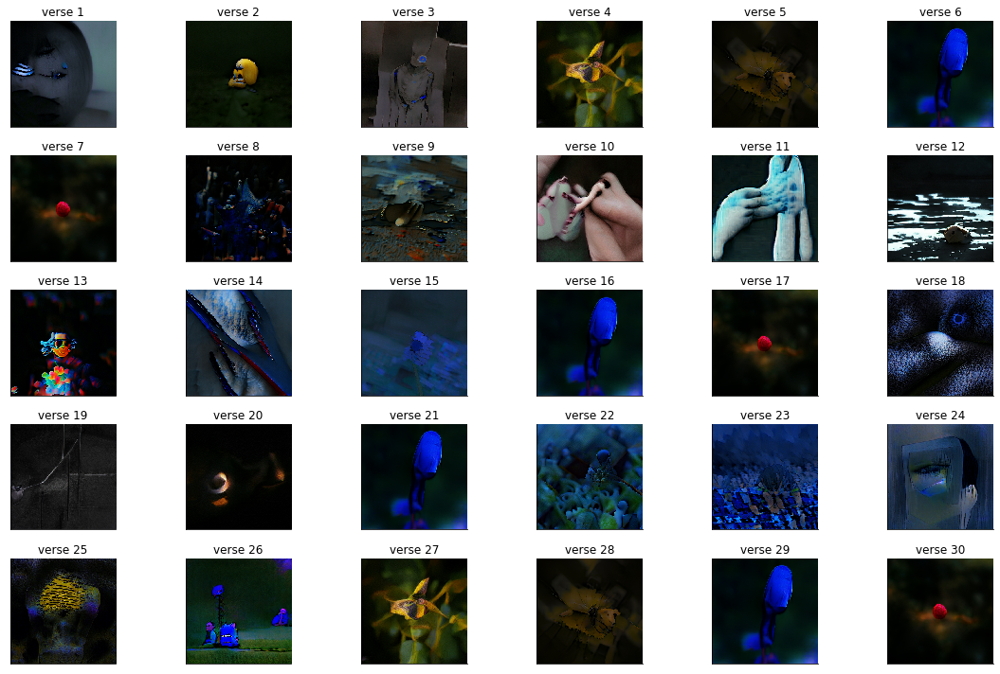

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axes = plt.subplots(5, 6, figsize=(16, 10), sharex=True, sharey=True)
for p, i in enumerate(x):
  npimg = lpips.tensor2im(images[i.item()])

  k, l = np.unravel_index(p, (5,6))
  axes[k, l].imshow(npimg, interpolation='nearest')
  axes[k, l].set_title('verse {}'.format(p + 1))
  axes[k, l].set_xticks([])
  axes[k, l].set_yticks([])

sns.despine(fig)
fig.tight_layout()

In [ ]:
import random
K_C = len(sub_set_images)
all_sequences = []
for l in lyrics:
  print(str(l)+"/" + str(len(lyrics)))
  l_category_imgs = [cat_indices_reversed[i] for i in verse_category_keys[l].values()]
  T = len(l_category_imgs)
  if T == 1:
    continue
  m = [list(range(T))*T, list(np.repeat(list(range(T)),T))]
  A_sub = make_submatrix2(l, l_category_imgs, sub_set_images, K_C)
  Pi = torch.zeros(K_C)
  cat_init = image_categories[x[l].item()][0] #the category of the first picture of the verse 

  cat_img = cat_indices_reversed[verse_category_keys[l][cat_init]] #the image corresponding to that category for this verse 
  Pi[cat_img] = 1
  if l < len(lyrics)-1:
    cat_final = image_categories[x[l+1].item()][0]
    try:
      x_T = cat_indices_reversed[verse_category_keys[l][cat_final]] #want to end on the same category that we start on next
    except:
      print("next category is not in verse")
      x_T = None
  else:
    x_T = None
  x_wv, T1, T2 = viterbi(T, [A_sub]*T, K_C, Pi, x_T) 
  all_sequences.append([cat_indices[i.item()] for i in x_wv])

0/30
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth
190
1/30
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth
378
2/30
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth
190
3/30
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth
435
next category is not in verse
4/30
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/alex.pth
666
5/30
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.7/dist-pac

In [ ]:
K_C

420

In [ ]:
K_C / 2

210.0

In [ ]:
all_sequences

[[1558,
  1559,
  1565,
  1566,
  1572,
  1573,
  1575,
  1576,
  1577,
  1599,
  1606,
  1570,
  1572,
  1573,
  1575,
  1576,
  1577,
  1599,
  1606,
  1559],
 [829,
  830,
  831,
  832,
  833,
  834,
  835,
  836,
  857,
  864,
  831,
  832,
  833,
  834,
  835,
  836,
  857,
  864,
  829,
  831,
  832,
  833,
  834,
  835,
  836,
  857,
  864,
  796],
 [51,
  87,
  90,
  91,
  92,
  93,
  94,
  95,
  91,
  92,
  93,
  94,
  95,
  90,
  91,
  92,
  93,
  94,
  95,
  28],
 [0,
  323,
  408,
  412,
  414,
  416,
  417,
  418,
  419,
  408,
  412,
  414,
  416,
  417,
  418,
  419,
  408,
  412,
  414,
  416,
  417,
  418,
  419,
  408,
  412,
  414,
  416,
  417,
  418,
  419],
 [0,
  1067,
  1679,
  1680,
  1681,
  1703,
  1704,
  1676,
  1679,
  1680,
  1681,
  1703,
  1704,
  1676,
  1679,
  1680,
  1681,
  1703,
  1704,
  1676,
  1679,
  1680,
  1681,
  1703,
  1704,
  1679,
  1680,
  1681,
  1703,
  1704,
  1676,
  1679,
  1680,
  1681,
  1703,
  1704,
  1631],
 [1281,
  1282,
  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


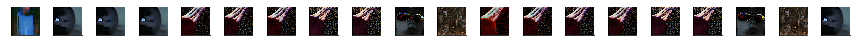

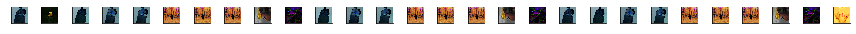

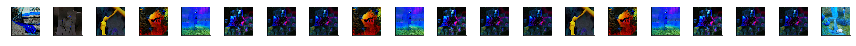

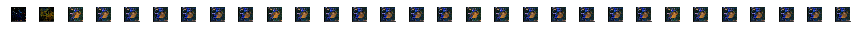

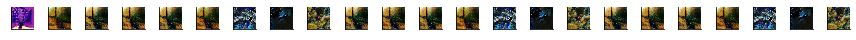

...

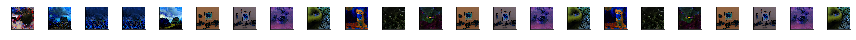

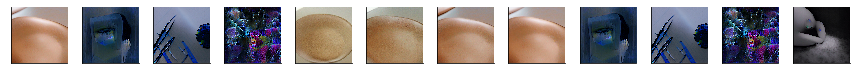

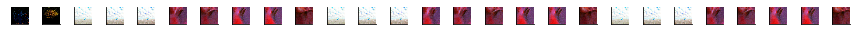

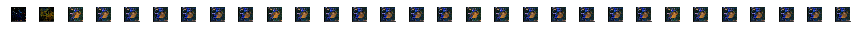

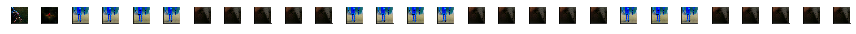

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

for s, sequence in enumerate(all_sequences):
  fig, axes = plt.subplots(1, len(sequence), figsize=(12, 12), sharex=True, sharey=True)
  #axes.set_title('verse {}'.format(s))
  for p, i in enumerate(sequence):
    npimg = lpips.tensor2im(images[i])

    k, l = np.unravel_index(p, (1,len(sequence)))
    axes[l].imshow(npimg, interpolation='nearest')
    axes[l].set_xticks([])
    axes[l].set_yticks([])

  sns.despine(fig)
  fig.tight_layout()

In [ ]:
import cv2

for seq in all_sequences:
  for s in seq:
    cv2.imwrite(lpips.tensor2im(images[s]), str(seq)+str(s)+".png")

SystemError: ignored

In [ ]:
29/2

14.5

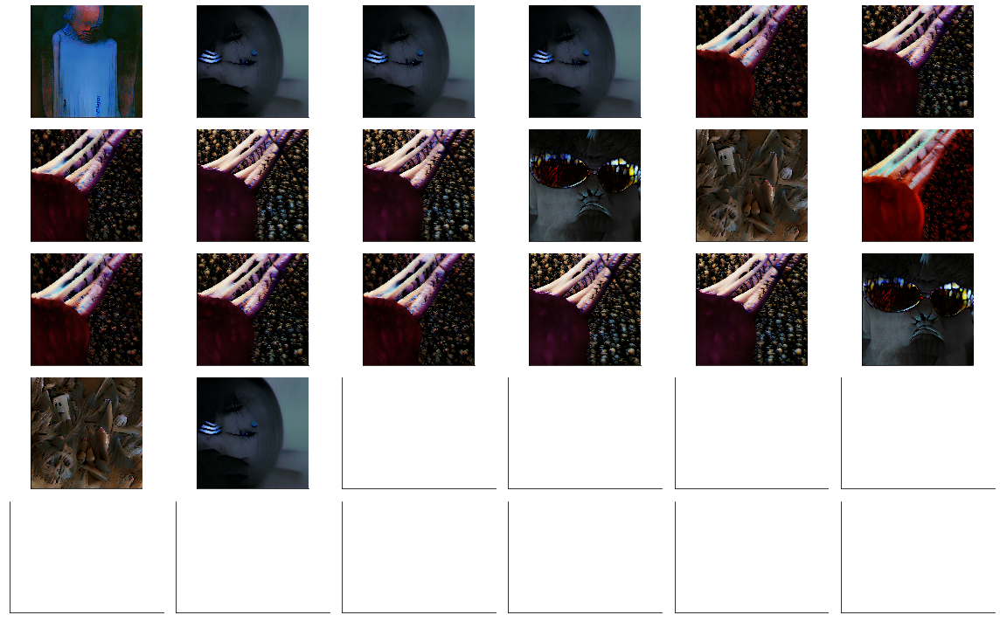

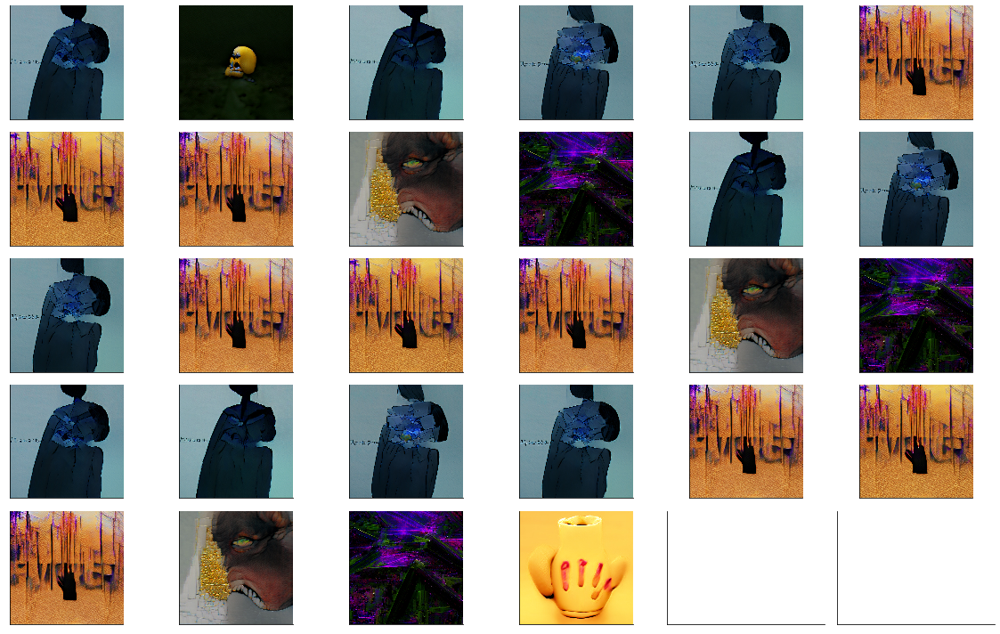

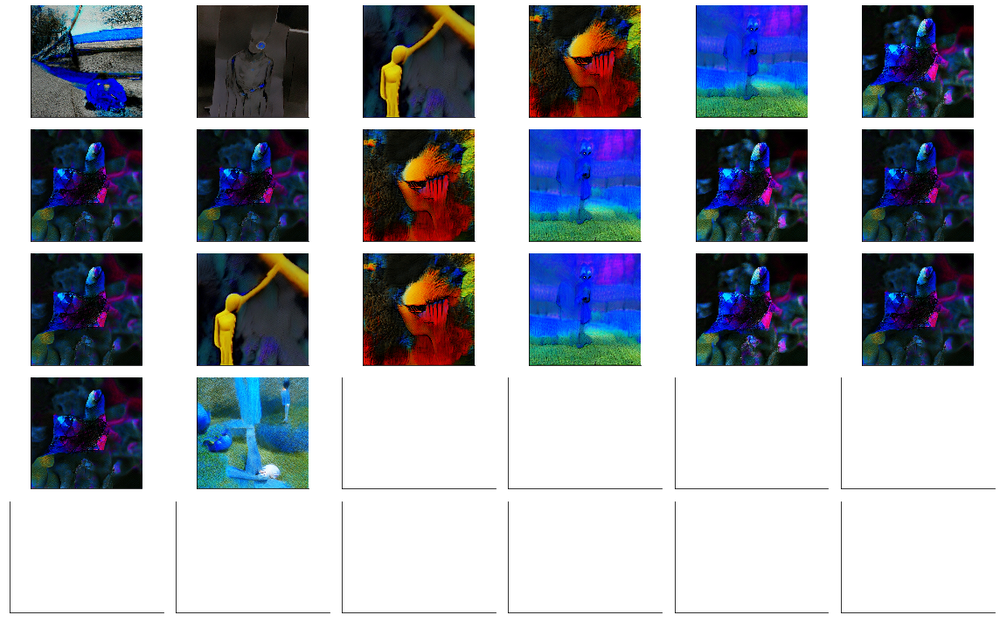

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
s = all_sequences[0]
fig, axes = plt.subplots(5, 6, figsize=(16, 10), sharex=True, sharey=True)
for p, i in enumerate(s):
  npimg = lpips.tensor2im(images[i])

  k, l = np.unravel_index(p, (5,6))
  axes[k, l].imshow(npimg, interpolation='nearest')
  axes[k, l].set_xticks([])
  axes[k, l].set_yticks([])

sns.despine(fig)
fig.tight_layout()


s = all_sequences[1]
fig, axes = plt.subplots(5, 6, figsize=(16, 10), sharex=True, sharey=True)
for p, i in enumerate(s):
  npimg = lpips.tensor2im(images[i])

  k, l = np.unravel_index(p, (5,6))
  axes[k, l].imshow(npimg, interpolation='nearest')
  axes[k, l].set_xticks([])
  axes[k, l].set_yticks([])

sns.despine(fig)
fig.tight_layout()

s = all_sequences[2]
fig, axes = plt.subplots(5, 6, figsize=(16, 10), sharex=True, sharey=True)
for p, i in enumerate(s):
  npimg = lpips.tensor2im(images[i])

  k, l = np.unravel_index(p, (5,6))
  axes[k, l].imshow(npimg, interpolation='nearest')
  axes[k, l].set_xticks([])
  axes[k, l].set_yticks([])

sns.despine(fig)
fig.tight_layout()